In [110]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import polars as pl
import seaborn as sns

from sentence_transformers import SentenceTransformer
from sklearn.metrics.pairwise import cosine_similarity

# AII

In [111]:
keywords = [
    'machine learning',
    'deep learning',
    'artificial intelligence',
    'reinforcement learning',
    'neural network',
    # 'image recognition',
    'computer vision',
    'natural language processing',
    # 'model training',
    # 'inference',
    # 'hyperparameter',
    'speech processing',
    'control methods',
    'knowledge representation',
    'planning',
    'predictive analytics',
    'robotics',
]

In [112]:
patents = pd.read_csv('datasets/ai_patents.csv').drop('index', axis=1)
patents['year'] = patents['publication_date'].astype(str).str[:4].astype(int)
patents.head()

,publication_number,application_number,publication_date,title,abstract,code,year
0,US-8756170-B2,US-201113115400-A,20140617,Regular expression matching method and system,"The present invention discloses a regex matching method and system, and relates to the field of ...",G06N99/005,2014
1,US-2016364537-A1,US-201514740255-A,20161215,Diagnostic support systems using machine learning techniques,Systems for diagnostic decision support utilizing machine learning techniques are provided. A li...,A61B5/7267,2016
2,US-2017103055-A1,US-201615362590-A,20170413,Patent drafting system,Systems and methods are disclosed to analyze a patent document by receiving patent application t...,G06F17/27,2017
3,US-2017166204-A1,US-201615240504-A,20170615,Method and apparatus for controlling path of autonomous driving system,A method for controlling a path of an autonomous driving system includes: determining whether or...,G05D1/0088,2017
4,US-2017168485-A1,US-201514968848-A,20170615,System and Method for Controlling Autonomous Vehicles,A method determines iteratively a motion of the vehicle from an initial location and a target lo...,G05D1/0088,2017


In [114]:
(
    pl.read_csv('datasets/ai_patents.csv')
    .with_columns(
        pl.col('publication_date').cast(str).str.slice(0, 4).alias('year').cast(int)
    )
    .filter(pl.col('year').ge(2015))
    .filter(pl.col('year').le(2020))
    .shape
)

(74875, 8)

In [115]:
from sklearn.feature_extraction.text import CountVectorizer

vec = CountVectorizer(lowercase=True, ngram_range=(1, 3), vocabulary=keywords, binary=True)
# X = vec.fit_transform(patents[patents['year'].ge(2015) & patents['year'].le(2020)].abstract.values)
X = vec.fit_transform(patents.abstract.values)

In [6]:
total = pd.DataFrame({
    'keywords': keywords,
    'freq': np.array(X.sum(axis=0)).flatten()
})
print(
    total.set_index('keywords')
    .style.to_latex()
)

\begin{tabular}{lr}
 & freq \\
keywords &  \\
machine learning & 10904 \\
deep learning & 1848 \\
artificial intelligence & 2674 \\
reinforcement learning & 506 \\
neural network & 9364 \\
computer vision & 463 \\
natural language processing & 917 \\
speech processing & 126 \\
control methods & 29 \\
knowledge representation & 24 \\
planning & 1050 \\
predictive analytics & 69 \\
robotics & 64 \\
\end{tabular}



In [7]:
(X.sum(axis=1) != 0).sum(axis=0)

matrix([[25283]])

In [8]:
# model = SentenceTransformer('sentence-transformers/sentence-t5-xl')

In [9]:
# pool = model.start_multi_process_pool()
# abstract_embeddings = model.encode_multi_process(patents.abstract.values, pool)
# model.stop_multi_process_pool(pool)
# np.save('datasets/abstract_embeddings_t5-xl.npy')

In [10]:
patent_mask = (np.array(X.sum(axis=1)) != 0).flatten()
patents = patents[patent_mask].reset_index(drop=True).copy()

In [11]:
abstract_embeddings = np.load('datasets/abstract_embeddings_t5-xl.npy')
abstract_embeddings = abstract_embeddings[patent_mask].copy()

In [12]:
assert patents.shape[0] == abstract_embeddings.shape[0]

In [13]:
task_ratings = pd.read_csv('datasets/db_24_3_text/Task Ratings.txt', sep='\t').query('`Scale ID` == "IM"')
task_statements = pd.read_csv('datasets/db_24_3_text/Task Statements.txt', sep='\t')
jobs = pd.read_csv('datasets/db_24_3_text/Occupation Data.txt', sep='\t')
jobs['SOC Code'] = jobs['O*NET-SOC Code'].str[:7]

In [14]:
tasks = pd.merge(
    task_ratings,
    task_statements[['O*NET-SOC Code', 'Task ID', 'Task']],
    how='left',
    on=['O*NET-SOC Code', 'Task ID']
)

In [15]:
tasks.shape

(19498, 13)

In [16]:
# task_embeddings = model.encode(tasks['Task'].values)
# np.save('datasets/task_embeddings_t5.npy', task_embeddings)
task_embeddings = np.load('datasets/task_embeddings_t5-xl.npy')

In [18]:
def compute_scores(task_embeddings, abstract_embeddings, tasks, jobs, aioe=None, threshold=0.8):
    similarity = cosine_similarity(
        task_embeddings,
        abstract_embeddings
    )

    task_df = tasks.copy()

    # threshold = task_df['similarity'].quantile(.95)
    task_df['similarity'] = similarity.max(axis=1)
    task_df['patent_index'] = similarity.argmax(axis=1)
    task_df['weight'] = task_df['Data Value'] / task_df.groupby('O*NET-SOC Code')['Data Value'].transform('sum')
    # task_df['similarity_t'] = task_df['similarity'] * (task_df['similarity'] > threshold).astype(int)
    # task_df['aii'] = task_df['similarity'] * task_df['weight']
    task_df['aii'] = task_df['similarity'].gt(threshold)

    jobs_aii = pd.merge(
        task_df.groupby('O*NET-SOC Code').agg({'aii': 'mean'}).reset_index(),
        jobs,
        how='left',
        on='O*NET-SOC Code'
    )

    if aioe is not None:
        data = pd.merge(
            aioe,
            jobs_aii.groupby('SOC Code').aii.mean().reset_index(),
            how='left',
            on='SOC Code'
        ).rename({'AIOE': 'aioe'}, axis=1)

        return data
    else:
        return jobs_aii

In [19]:
similarity = cosine_similarity(
    task_embeddings,
    abstract_embeddings[patents[patents['year'].ge(2015) & patents['year'].le(2020)].index]
)

In [20]:
print(f"Tasks: {similarity.shape[0]:,.0f}")
print(f"Patents: {similarity.shape[1]:,.0f}")

Tasks: 19,498
Patents: 12,984


In [21]:
from sklearn.linear_model import LinearRegression

support = np.arange(2010, 2021).reshape(-1, 1)
reg = LinearRegression()
reg.fit(support, np.log(patents['year'].value_counts().sort_index()[:-2]))
pred = np.exp(reg.predict(np.arange(1990, 2021).reshape(-1, 1)))

In [22]:
pred[-5:].sum() / pred.sum()

0.918099566340291

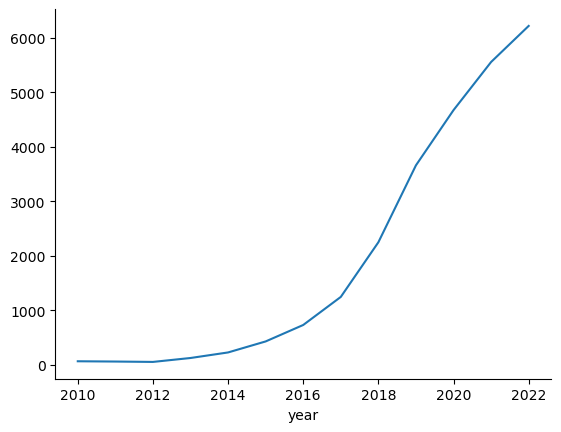

In [23]:
patents['year'].value_counts().sort_index().plot.line()
sns.despine()

In [25]:
p_threshold = .90

tasks['similarity'] = similarity.max(axis=1)
tasks['patent_index'] = similarity.argmax(axis=1)
tasks['weight'] = tasks['Data Value'] / tasks.groupby('O*NET-SOC Code')['Data Value'].transform('sum')
tasks['similarity_t'] = tasks['similarity'] * (tasks['similarity'] > tasks['similarity'].quantile(p_threshold)).astype(int)
tasks['s'] = tasks['similarity'].gt(tasks['similarity'].quantile(p_threshold))
tasks['aii'] = tasks['similarity'] * tasks['weight']

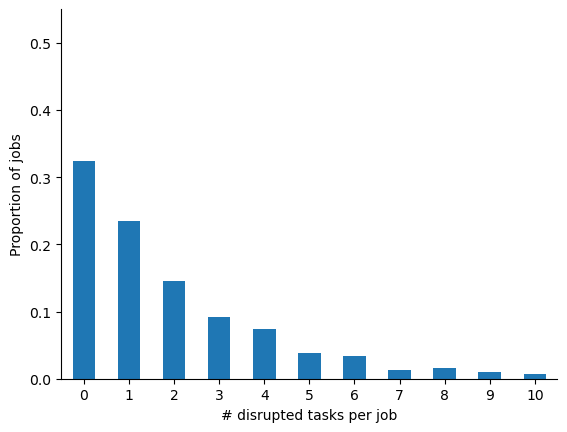

In [26]:
tasks.groupby('O*NET-SOC Code').s.sum().value_counts(True).sort_index().plot.bar()
plt.xlabel('# disrupted tasks per job')
plt.ylabel('Proportion of jobs')
plt.xlim(-0.5, 10.5)
plt.ylim(0, 0.55)
plt.xticks(rotation=0)
sns.despine()

In [27]:
tasks['similarity'].describe()

count    19498.000000
mean         0.762848
std          0.029585
min          0.651865
25%          0.742459
50%          0.762724
75%          0.783310
max          0.879776
Name: similarity, dtype: float64

In [28]:
print(f"Similarity threshold: {tasks['similarity'].quantile(p_threshold):.2f}")

Similarity threshold: 0.80


/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


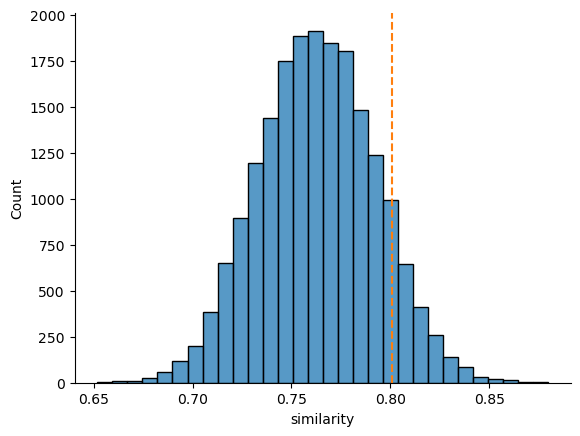

In [29]:
sns.histplot(x=tasks['similarity'], bins=30)
plt.axvline(tasks['similarity'].quantile(p_threshold), linestyle='--', c='C1')
sns.despine()

In [30]:
# jobs_aii = pd.merge(
#     # tasks.groupby('O*NET-SOC Code').agg({'aii': 'sum'}).reset_index(),
#     tasks.groupby('O*NET-SOC Code').agg({'s': 'mean'}).reset_index(),
#     jobs,
#     how='left',
#     on='O*NET-SOC Code'
# )

jobs_aii = (
    pl.from_dataframe(tasks)
    .group_by('O*NET-SOC Code')
    .agg(
        # pl.col('aii').sum(),
        pl.col('s').mean().alias('aii'),
        pl.col('s').sum().alias('nb_impacted_tasks'),
        pl.col('s').count().alias('total_tasks'),
    )
    # .agg(pl.col('s').mean().alias('aii'))
    .join(
        pl.from_dataframe(jobs),
        how='left',
        on='O*NET-SOC Code'
    )
    .to_pandas()
)

In [33]:
aioe = pd.read_excel('datasets/AIOE_DataAppendix.xlsx', sheet_name='Appendix A')

In [34]:
data = (
    pl.from_dataframe(aioe)
    .join(
        pl.from_dataframe(jobs_aii)
        .group_by('SOC Code')
        .agg(
            pl.col('nb_impacted_tasks').sum(),
            pl.col('total_tasks').sum(),
            pl.col('nb_impacted_tasks').sum().truediv(pl.col('total_tasks').sum()).alias('aii')
        ),
        how='left',
        on='SOC Code'
    )
    .to_pandas()
).rename({'AIOE': 'aioe'}, axis=1)

In [35]:
data['aii'].eq(0).mean()

0.32945736434108525

In [36]:
data['aii'].describe()

count    773.000000
mean       0.091582
std        0.105972
min        0.000000
25%        0.000000
50%        0.059908
75%        0.133333
max        0.600000
Name: aii, dtype: float64

In [37]:
data['total_tasks'].describe()

count    773.000000
mean      25.223803
std       23.031806
min        4.000000
25%       16.000000
50%       20.000000
75%       26.000000
max      286.000000
Name: total_tasks, dtype: float64

/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


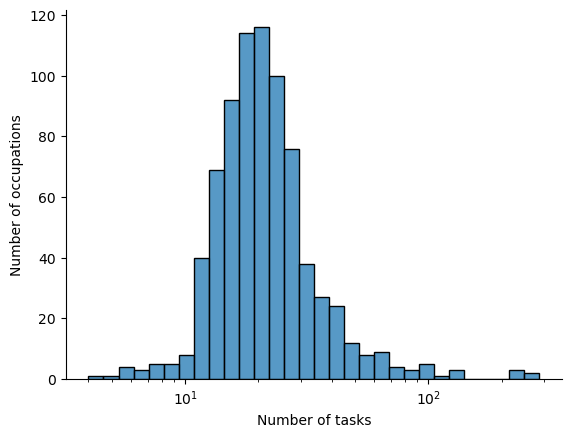

In [38]:
sns.histplot(x=data['total_tasks'], bins=30, log_scale=True)
plt.xlabel('Number of tasks')
plt.ylabel('Number of occupations')
sns.despine()
plt.savefig('figures/task-histogram.pdf', bbox_inches='tight')

/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


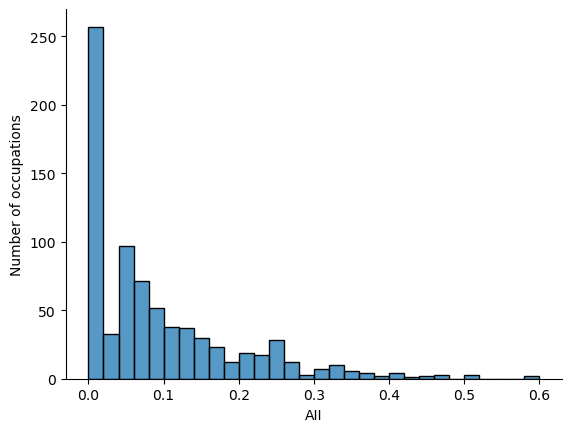

In [39]:
sns.histplot(x=data['aii'], bins=30)
plt.xlabel('AII')
plt.ylabel('Number of occupations')
sns.despine()
plt.savefig('figures/aii-histogram.pdf', bbox_inches='tight')

In [40]:
data['total_tasks'].describe()

count    773.000000
mean      25.223803
std       23.031806
min        4.000000
25%       16.000000
50%       20.000000
75%       26.000000
max      286.000000
Name: total_tasks, dtype: float64

In [41]:
pd.DataFrame({
    'Highest scoring': data.nlargest(20, ['aii', 'total_tasks'])['Occupation Title'].reset_index(drop=True),
    # 'Mid scoring': data.sort_values(['aii', 'total_tasks']).iloc[np.arange(377, 397)]['Occupation Title'].reset_index(drop=True),
    'Lowest scoring': data.nsmallest(20, ['aii', 'total_tasks'])['Occupation Title'].reset_index(drop=True),
})

,Highest scoring,Lowest scoring
0,Cardiovascular Technologists and Technicians,Pile-Driver Operators
1,Orthodontists,"Graders and Sorters, Agricultural Products"
2,Medical Records and Health Information Technic...,Floor Sanders and Finishers
3,Numerical Tool and Process Control Programmers,Aircraft Cargo Handling Supervisors
4,Multi-Media Artists and Animators,Dredge Operators
5,Magnetic Resonance Imaging Technologists,"Insurance Appraisers, Auto Damage"
6,Nuclear Medicine Technologists,Insurance Underwriters
7,"Software Developers, Applications",Reinforcing Iron and Rebar Workers
8,Electro-Mechanical Technicians,Farm Labor Contractors
9,Industrial Truck and Tractor Operators,Water and Liquid Waste Treatment Plant and Sys...


In [43]:
tasks['SOC Code'] = tasks['O*NET-SOC Code'].str[:7]

In [45]:
patent_map = patents[patents['year'].ge(2015) & patents['year'].le(2020)].title.reset_index(drop=True).to_dict()
patent_abstract_map = patents[patents['year'].ge(2015) & patents['year'].le(2020)].abstract.reset_index(drop=True).to_dict()
job_ids = data.nlargest(20, ['aii', 'total_tasks'])['SOC Code'].tolist()
top_tasks = (
    pl.from_dataframe(tasks)
    .filter(pl.col('SOC Code').is_in(job_ids))
    .sort('similarity')
    .group_by('SOC Code')
    .tail(1)
    .join(
        pl.from_dataframe(data),
        how='left',
        on='SOC Code'
    )
    .sort(['aii', 'total_tasks'], descending=True)
    .select('SOC Code', 'Occupation Title', 'Task', 'patent_index', 'similarity', 'nb_impacted_tasks', 'total_tasks')
    .to_pandas()
)

top_tasks['patent'] = top_tasks['patent_index'].map(patent_map)

top_patents = top_tasks['patent_index'].tolist()
top_patents = tasks[tasks['patent_index'].isin(top_patents)].groupby('patent_index').agg({
    'SOC Code': ['count', pd.Series.nunique]
})
top_patents.columns = ['nb_tasks', 'nb_jobs']

top_tasks = top_tasks.merge(
    top_patents,
    how='left',
    left_on='patent_index',
    right_index=True
)

In [46]:
pd.options.display.max_colwidth = 100

In [47]:
print(
    pl.from_dataframe(tasks[tasks['Task ID'].isin([18295, 19801, 18280])][['Task', 'patent_index', 'similarity']])
    .select(
        'Task',
        pl.col('patent_index').map_dict(patent_abstract_map).alias('Patent'),
        pl.col('similarity').alias('Similarity'),
    )
    .to_pandas()
    .style
    .format('{:.4f}', subset='Similarity')
    .to_latex()
)

\begin{tabular}{lllr}
 & Task & Patent & Similarity \\
0 & Document and maintain records of precision agriculture information. & A method and system for predicting soil and/or plant condition in precision agriculture with a classification of measurement data for providing an assignment of a measurement parcel to classes of interest. The assignment is used for providing action recommendations, particularly in real time or close to real time, to a farmer and/or to an agricultural device based on acquired measurement data, particularly remote sensing data, and wherein a classification model is trained by a machine learning algorithm, e.g. relying on deep learning for supervised and/or unsupervised learning, and is potentially continuously refined and adapted thanks to a feedback procedure. & 0.7901 \\
1 & Apply precision agriculture information to specifically reduce the negative environmental impacts of farming practices. & A method and system for predicting soil and/or plant condition i

In [48]:
zzz = (
    pl.from_dataframe(top_tasks)
    .select(
        pl.col('Occupation Title').alias('Title'),
        'Task',
        pl.col('patent').alias('Patent'),
        pl.col('similarity').alias('Similarity'),
        pl.col('nb_impacted_tasks').alias('# Impacted Tasks'),
        pl.col('total_tasks').alias('Total Tasks'),
        pl.col('nb_impacted_tasks').truediv(pl.col('total_tasks')).alias('AII'),
        # pl.col('nb_tasks').alias('# Tasks'),
        # pl.col('nb_jobs').alias('# Jobs'),
    )
    .sort(['AII', 'Total Tasks'], descending=True)
    .to_pandas()
    # .to_markdown()
)
print(
    zzz
    .style.format({
            'Similarity': '{:.4f}',
            'AII': '{:.2f}',
            '# Impacted Tasks': '{:.0f}',
            'Total Tasks': '{:.0f}',
    })
    .to_latex()
)
# zzz

\begin{tabular}{llllrrrr}
 & Title & Task & Patent & Similarity & # Impacted Tasks & Total Tasks & AII \\
0 & Cardiovascular Technologists and Technicians & Observe gauges, recorder, and video screens of data analysis system during imaging of cardiovascular system. & Automated analysis of vasculature in coronary angiograms & 0.8753 & 15 & 25 & 0.60 \\
1 & Orthodontists & Study diagnostic records, such as medical or dental histories, plaster models of the teeth, photos of a patient's face and teeth, and X-rays, to develop patient treatment plans. & Patient-Specific Therapy Planning Support Using Patient Matching & 0.8460 & 6 & 10 & 0.60 \\
2 & Medical Records and Health Information Technicians & Plan, develop, maintain, or operate a variety of health record indexes or storage and retrieval systems to collect, classify, store, or analyze information. & Dynamic health record problem list & 0.8350 & 10 & 20 & 0.50 \\
3 & Numerical Tool and Process Control Programmers & Determine the sequen

In [52]:
national = pd.read_excel('datasets/national_M2020_dl.xlsx')

# Trends

In [54]:
occupations = pl.read_csv('datasets/db_24_3_text/Occupation Level Metadata.txt', separator='\t')

In [55]:
df = pd.DataFrame()
for year in range(2015, 2021):
    temp_df = compute_scores(
        task_embeddings,
        abstract_embeddings[patents.query('2015 <= year <= @year').index],
        tasks,
        jobs,
        aioe
    )
    temp_df['year'] = year
    df = pd.concat([df, temp_df], ignore_index=True)

In [56]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

trends = []
for code, group in df.dropna().groupby('SOC Code'):
    reg = LinearRegression()
    support = np.arange(len(group)).reshape(-1, 1)
    y = group['aii']
    reg.fit(support, y)
    y_pred = reg.predict(support)
    r2 = r2_score(y, y_pred)
    trends.append({
        'SOC Code': code,
        'slope': reg.coef_[0],
        'difference': group['aii'].max() - group['aii'].min(),
        'aii': group['aii'].max(),
        'r2': r2,
    })
trends = pd.DataFrame(trends)

/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


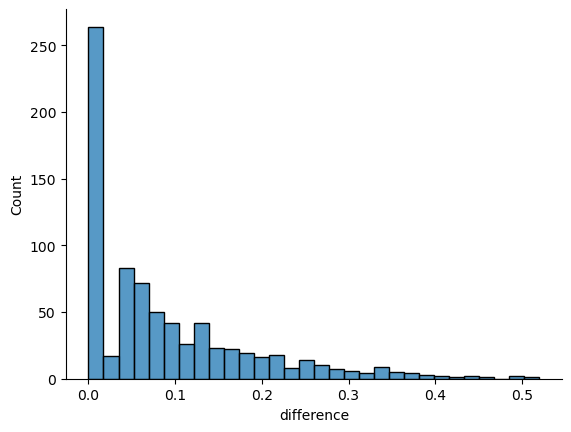

In [57]:
sns.histplot(x=trends['difference'], bins=30)
sns.despine()

In [58]:
trends['difference'].describe(percentiles=[0.25, 0.5, 0.75, 0.9])

count    773.000000
mean       0.086583
std        0.099458
min        0.000000
25%        0.000000
50%        0.055556
75%        0.133333
90%        0.226341
max        0.520000
Name: difference, dtype: float64

In [59]:
t = trends.query('difference != 0').difference.median()
trends['group'] = np.select(
    [trends['difference'] == 0, trends['difference'] <= t],
    [0, 1],
    2
)

In [60]:
data.nlargest(20, 'aii')['SOC Code'].values == trends.nlargest(20, 'aii')['SOC Code'].values

array([ True,  True, False, False, False, False, False,  True, False,
       False, False, False, False, False, False, False, False, False,
       False, False])

In [66]:
threshold = tasks['similarity'].quantile(p_threshold)

def find_most_disrupted_tasks(task_embeddings, abstract_embeddings, tasks, patents):
    assert task_embeddings.shape[0] == tasks.shape[0]
    assert abstract_embeddings.shape[0] == patents.shape[0]

    similarity = cosine_similarity(
        task_embeddings,
        abstract_embeddings
    )

    task_df = tasks.copy()

    patent_map = patents.abstract.reset_index(drop=True).to_dict()
    task_df['similarity'] = similarity.max(axis=1)
    task_df['patent_index'] = similarity.argmax(axis=1)
    task_df['s'] = task_df['similarity'].gt(threshold).astype(int)
    task_df['similarity_t'] = task_df['similarity'] * task_df['s']
    task_df['closest_patent'] = task_df['patent_index'].map(patent_map)
    return task_df

In [67]:
patents.query('2015 <= year <= 2020').shape[0] / patents.query('2010 <= year <= 2020').shape[0]

0.9611370197646014

In [68]:
disrupted_tasks = pd.DataFrame()

for year in range(2015, 2020):
    # soc_codes = bumps[bumps['year'].eq(year)]['SOC Code'].values
    # task_ids = tasks[tasks['SOC Code'].isin(soc_codes)].index.values
    task_ids = tasks[tasks['SOC Code'].isin(job_ids)].index.values
    patent_ids = patents[patents['year'].ge(2015) & patents['year'].le(year)].index.values

    disrupted_tasks = pd.concat([
        disrupted_tasks,
        (
            pl.from_dataframe(
                find_most_disrupted_tasks(
                    task_embeddings[task_ids],
                    abstract_embeddings[patent_ids],
                    tasks.loc[task_ids],
                    patents.loc[patent_ids],
                )
            )
            .filter(pl.col('s').eq(1))
            .select(
                'SOC Code',
                pl.col('Task').alias('task'),
                pl.col('closest_patent').alias('patent'),
                'similarity',
                's',
                pl.lit(year, dtype=int).alias('year')
            )
            .to_pandas()
        )
    ], ignore_index=True)

In [71]:
sector_map = {
    '29-2035': 'Health care and social assistance',
    '15-1132': 'Information',
    '27-4014': 'Information',
    '15-1131': 'Information',
    '19-4099': 'Information',
    '19-2099': 'Information',
    '17-2031': 'Information',
}

job_sectors = (
    occupations
    .filter(pl.col('Item').eq('NAICS Sector'))
    .filter(pl.col('Percent').ne('n/a'))
    .filter(pl.col('Percent').cast(float).ge(50))
    .with_columns(
        pl.col('O*NET-SOC Code').str.slice(0, 7).alias('SOC Code')
    )
    .filter(pl.col('SOC Code').is_in(disrupted_tasks['SOC Code'].unique().tolist()))
    .join(pl.from_dataframe(data), on='SOC Code')
    .select(
        'SOC Code',
        pl.col('Response').alias('sector'),
    )
    .to_pandas()
)

job_sectors = data.nlargest(20, 'aii').merge(
    job_sectors,
    how='left',
    on='SOC Code'
)

job_sectors['sector'] = job_sectors['sector'].fillna(job_sectors['SOC Code'].map(sector_map))
job_sectors.loc[job_sectors['SOC Code'].eq('19-4099'), 'sector'] = 'Information'
job_sectors.loc[job_sectors['SOC Code'].eq('53-2011'), 'sector'] = 'Information'
job_sectors.loc[job_sectors['SOC Code'].eq('47-5021'), 'sector'] = 'Manufacturing'

In [72]:
job_sectors.sort_values('sector')

,SOC Code,Occupation Title,aioe,nb_impacted_tasks,total_tasks,aii,sector
0,29-1023,Orthodontists,0.161663,6.0,10.0,0.600000,Health care and social assistance
1,29-2031,Cardiovascular Technologists and Technicians,-0.090953,15.0,25.0,0.600000,Health care and social assistance
3,29-2071,Medical Records and Health Information Technicians,0.573877,10.0,20.0,0.500000,Health care and social assistance
5,29-2035,Magnetic Resonance Imaging Technologists,-0.072763,11.0,23.0,0.478261,Health care and social assistance
6,29-2033,Nuclear Medicine Technologists,0.085528,8.0,17.0,0.470588,Health care and social assistance
13,31-9094,Medical Transcriptionists,1.062590,6.0,15.0,0.400000,Health care and social assistance
17,19-2099,"Physical Scientists, All Other",1.140157,9.0,24.0,0.375000,Information
16,53-2011,"Airline Pilots, Copilots, and Flight Engineers",-0.207063,10.0,26.0,0.384615,Information
12,19-4099,"Life, Physical, and Social Science Technicians, All Other",0.450104,27.0,67.0,0.402985,Information
11,15-1131,Computer Programmers,1.271506,7.0,17.0,0.411765,Information


In [73]:
data[data['Occupation Title'].str.contains('Truck')]

,SOC Code,Occupation Title,aioe,nb_impacted_tasks,total_tasks,aii
588,49-3031,Bus and Truck Mechanics and Diesel Engine Specialists,-1.010472,4.0,25.0,0.160000
738,53-3032,"Truck Drivers, Heavy and Tractor-Trailer",-1.149057,6.0,31.0,0.193548
739,53-3033,"Truck Drivers, Light or Delivery Services",-1.120501,1.0,14.0,0.071429
763,53-7051,Industrial Truck and Tractor Operators,-1.398690,5.0,11.0,0.454545
773,53-7121,"Tank Car, Truck, and Ship Loaders",-1.387760,1.0,19.0,0.052632


In [74]:
short_title_map = {
    'Orthodontists': 'Orthodontists',
    'Cardiovascular Technologists and Technicians': 'Cardiovascular Technologists',
    'Multi-Media Artists and Animators': 'Multi-Media Artists',
    'Medical Records and Health Information Technicians': 'Medical Information Technicians',
    'Numerical Tool and Process Control Programmers': 'Numerical and Control Programmers',
    'Magnetic Resonance Imaging Technologists': 'Magnetic Resonance Imaging Technologists',
    'Nuclear Medicine Technologists': 'Nuclear Medicine Technologists',
    'Software Developers, Applications': 'Software Developers',
    'Electro-Mechanical Technicians': 'Electro-Mechanical Technicians',
    'Industrial Truck and Tractor Operators': 'Industrial Truck and Tractor Operators',
    'Sound Engineering Technicians': 'Sound Engineering Technicians',
    'Computer Programmers': 'Computer Programmers',
    'Life, Physical, and Social Science Technicians, All Other': 'Science Technicians',
    'Medical Transcriptionists': 'Medical Transcriptionists',
    'Earth Drillers, Except Oil and Gas': 'Earth Drillers',
    'Grinding, Lapping, Polishing, and Buffing Machine Tool Setters, Operators, and Tenders, Metal and Plastic': 'Manual Machine Operators',
    'Airline Pilots, Copilots, and Flight Engineers': 'Flight Engineers',
    'Physical Scientists, All Other': 'Physical Scientists',
    'Computer-Controlled Machine Tool Operators, Metal and Plastic': 'Computer-Controlled Machine Tool Operators',
    'Biomedical Engineers': 'Biomedical Engineers',
}

In [75]:
(
    pl.from_dataframe(disrupted_tasks)
    .join(
        pl.from_dataframe(data),
        on='SOC Code'
    )
    .pivot(
        index='year',
        columns='Occupation Title',
        values='task',
        aggregate_function='count',
    )
    .fill_null(0)
    .select(pl.all().exclude('year').diff())
)

Computer Programmers,"Software Developers, Applications",Biomedical Engineers,Electro-Mechanical Technicians,"Physical Scientists, All Other","Life, Physical, and Social Science Technicians, All Other",Multi-Media Artists and Animators,Sound Engineering Technicians,Orthodontists,Cardiovascular Technologists and Technicians,Nuclear Medicine Technologists,Magnetic Resonance Imaging Technologists,Medical Records and Health Information Technicians,Medical Transcriptionists,"Earth Drillers, Except Oil and Gas","Computer-Controlled Machine Tool Operators, Metal and Plastic",Numerical Tool and Process Control Programmers,"Grinding, Lapping, Polishing, and Buffing Machine Tool Setters, Operators, and Tenders, Metal and Plastic","Airline Pilots, Copilots, and Flight Engineers",Industrial Truck and Tractor Operators
i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64
null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
1,0,2,1,0,7,1,1,0,8,0,2,5,0,0,1,2,1,0,1
0,1,0,6,4,3,0,0,0,1,2,5,2,3,1,2,0,0,0,0
0,1,0,1,1,5,2,1,2,1,0,0,2,3,2,2,2,2,0,2
4,4,2,5,1,4,3,2,0,1,1,3,1,0,4,4,1,3,8,0


/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(d

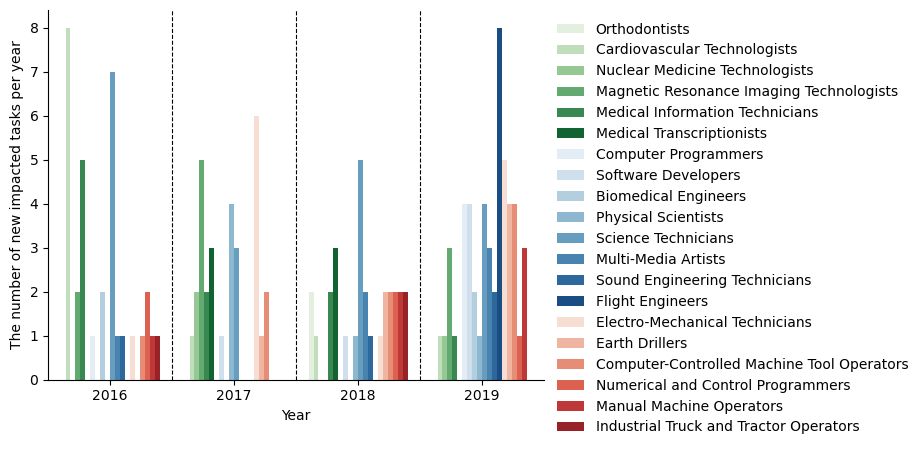

In [76]:
x = disrupted_tasks.pivot_table(
    index='year',
    columns='SOC Code',
    values='task',
    aggfunc='count',
    fill_value=0
)

q = x.diff().iloc[1:].reset_index().melt(id_vars='year').merge(
    job_sectors,
    how='left',
    on='SOC Code'
).sort_values(['sector', 'year'])

sns.barplot(
    x='year',
    y='value',
    hue='short_title',
    data=q.assign(short_title=q['Occupation Title'].map(short_title_map)),
    palette=sns.color_palette('Greens', 6) + sns.color_palette('Blues', 8) + sns.color_palette('Reds', 6),
)
for i in np.arange(0.5, 3.5):
    plt.axvline(i, color='k', linestyle='--', linewidth=.8)
plt.legend(bbox_to_anchor=(1, 1), frameon=False)
plt.xlabel('Year')
plt.ylabel('The number of new impacted tasks per year')
sns.despine()
plt.savefig('figures/trends-tasks.pdf', bbox_inches='tight')

/var/folders/0d/380dd3_d27v3p6p6m6nb230h0000gn/T/ipykernel_55155/3684061772.py:29: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


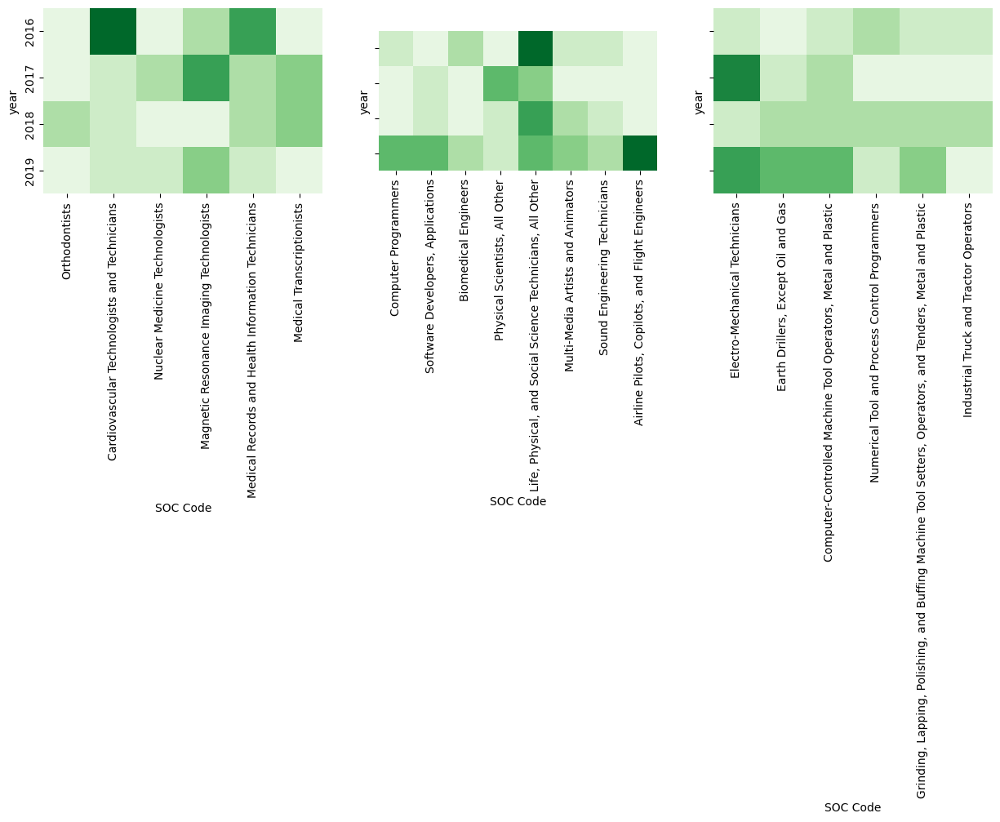

In [77]:
fig, axes = plt.subplots(ncols=3, sharey=True, figsize=(15, 5))
for ax, (s, group) in zip(axes.flatten(), q.groupby('sector')):
    cols = group['SOC Code'].unique().tolist()
    col_name_dict = group[['SOC Code', 'Occupation Title']].drop_duplicates().set_index('SOC Code')['Occupation Title'].to_dict()
    sns.heatmap(x[cols].rename(col_name_dict, axis=1).diff().iloc[1:], square=True, vmax=8, cmap=sns.color_palette('Greens', 8), cbar=False, ax=ax)
plt.tight_layout()
plt.savefig('figures/heatmap.pdf', bbox_inches='tight')

In [79]:
dt = disrupted_tasks.drop_duplicates(subset=['SOC Code', 'task'])

In [80]:
from sklearn.feature_extraction.text import TfidfVectorizer

v = TfidfVectorizer(ngram_range=(1, 3), max_features=50, stop_words='english')
xx = v.fit_transform(dt.patent.values)
xx = (
    pd.DataFrame(xx.todense(), columns=v.get_feature_names_out())
    .assign(year=dt.year.values)
    .groupby('year')
    .sum()
)

In [81]:
xx.T[2016].sort_values().tail(20).to_dict()

{'machine': 1.8465335378921368,
 'planning': 2.0947394147613614,
 'systems': 2.1151110692304407,
 'based': 2.1567948206243157,
 'medical': 2.230368412323953,
 'artificial': 2.265339898395788,
 'methods': 2.2816956681745193,
 'condition': 2.4765067009445603,
 'associated': 2.610866268300134,
 'information': 2.6302856620178665,
 'generate': 2.7241193260068965,
 'path': 2.747811443607942,
 'processing': 2.7656633228688623,
 'computer': 2.8921037366478326,
 'input': 2.9886830500632757,
 'image': 3.4056368683442573,
 'second': 3.649452240244569,
 'data': 3.720681603864007,
 'user': 3.85258980268011,
 'patient': 4.564352762596838}

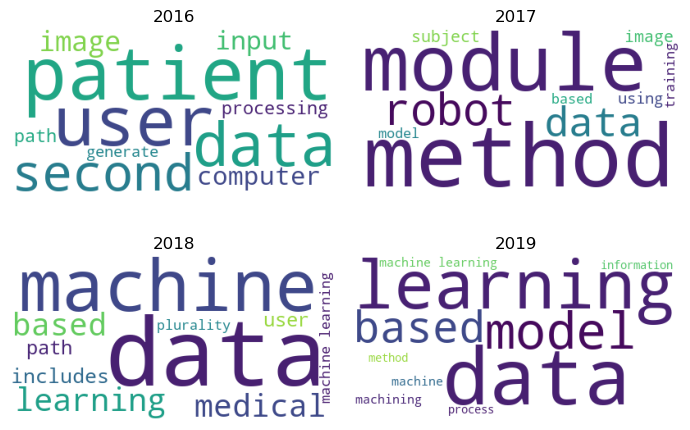

In [82]:
from wordcloud import WordCloud

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(7, 5))
for ax, year in zip(axes.flatten(), range(2016, 2020)):
    wc = WordCloud(background_color="white", random_state=42)
    wc.generate_from_frequencies(xx.T[year].sort_values().tail(10).to_dict())
    ax.imshow(wc)
    ax.set_title(year)
    ax.axis('off')
plt.tight_layout()
plt.savefig('figures/wordcloud.pdf', bbox_inches='tight')

In [86]:
print(
    pl.from_dataframe(disrupted_tasks)
    .join(pl.from_dataframe(data), on='SOC Code')
    .group_by('patent', 'year')
    .agg(
        pl.col('Occupation Title').first().alias('title'),
        pl.col('task').first(),
        pl.col('task').count().alias('nb_tasks'),
    )
    .filter(pl.col('nb_tasks').ne(1))
    .sort('year', 'nb_tasks')
    .select(
        'title',
        'task',
        'patent',
        'year',
        'nb_tasks'
    )
    .to_pandas()
    .style.to_latex()
)

\begin{tabular}{llllrr}
 & title & task & patent & year & nb_tasks \\
0 & Nuclear Medicine Technologists & Detect and map radiopharmaceuticals in patients' bodies, using a camera to produce photographic or computer images. & A method and apparatus for generating a 3D personalized mesh of a person from a depth camera image for medical imaging scan planning is disclosed. A depth camera image of a subject is converted to a 3D point cloud. A plurality of anatomical landmarks are detected in the 3D point cloud. A 3D avatar mesh is initialized by aligning a template mesh to the 3D point cloud based on the detected anatomical landmarks. A personalized 3D avatar mesh of the subject is generated by optimizing the 3D avatar mesh using a trained parametric deformable model (PDM). The optimization is subject to constraints that take into account clothing worn by the subject and the presence of a table on which the subject in lying. & 2015 & 2 \\
1 & Biomedical Engineers & Design and develop medica

In [90]:
print(
    pl.from_dataframe(tasks[tasks['SOC Code'].eq('47-4021')])
    .select(
        'Task',
        pl.col('s').alias('Is impacted?')
    )
    .to_pandas()
    .style
    .to_latex()
)

\begin{tabular}{llr}
 & Task & Is impacted? \\
0 & Assemble, install, repair, and maintain elevators, escalators, moving sidewalks, and dumbwaiters, using hand and power tools, and testing devices such as test lamps, ammeters, and voltmeters. & False \\
1 & Test newly installed equipment to ensure that it meets specifications, such as stopping at floors for set amounts of time. & False \\
2 & Locate malfunctions in brakes, motors, switches, and signal and control systems, using test equipment. & True \\
3 & Check that safety regulations and building codes are met, and complete service reports verifying conformance to standards. & False \\
4 & Connect electrical wiring to control panels and electric motors. & False \\
5 & Adjust safety controls, counterweights, door mechanisms, and components such as valves, ratchets, seals, and brake linings. & False \\
6 & Read and interpret blueprints to determine the layout of system components, frameworks, and foundations, and to select installatio

# Sectors

In [93]:
df_aii = pd.DataFrame()
for year in range(2015, 2021):
    data_aii = compute_scores(
        task_embeddings,
        abstract_embeddings[patents.query('year <= @year').index],
        tasks,
        jobs,
    )
    data_aii['year'] = year
    df_aii = pd.concat([df_aii, data_aii], ignore_index=True)

In [94]:
from scipy.stats import beta

def compute_industry_scores(occupations, jobs_aii, year=None):
    data = (
        occupations
        .filter(pl.col('Item') == 'NAICS Sector')
        .filter(pl.col('Percent') != 'n/a')
        .join(pl.from_dataframe(jobs_aii), on='O*NET-SOC Code')
        # .sort(pl.col('Percent').cast(float)).group_by('Response').tail(68) # Only taking top 10%
        .filter(pl.col('Percent').cast(float) > 50)
        .with_columns(
            (pl.col('Percent').cast(float) * pl.col('aii')).alias('score')
        )
        .group_by('Response')
        .agg(
            pl.col('score').sum(),
            pl.col('Percent').cast(float).sum()
        )
        .filter(pl.col('Response') != 'Unclassified')
        .sort('score')
        .to_pandas()
    )

    # Using conservative views and a weakly informative prior
    data['aii'] = beta(
        1 + data['score'],
        9 + data['Percent'] - data['score']
    ).ppf(.25)
    # data['aii'] = data['score'] / data['Percent']
    data['aii_std'] = beta(
        1 + data['score'],
        9 + data['Percent'] - data['score']
    ).std()

    if year:
        data['year'] = year

    return data

In [95]:
sector_name = {
    'Accommodation and food services': 'Accommodation and food services',
    'Administrative and support and waste management and remediation services': 'Waste management',
    'Agriculture, forestry, fishing and hunting': 'Agriculture',
    'Arts, entertainment, and recreation': 'Arts and entertainment',
    'Construction': 'Construction',
    'Education services': 'Education',
    'Finance and insurance': 'Finance and insurance',
    'Health care and social assistance': 'Healthcare',
    'Information': 'Information technology',
    'Manufacturing': 'Manufacturing',
    'Mining': 'Mining',
    'Other services, except public administration': 'Other services',
    'Professional, Scientific and Technical Services': 'Scientific and technical services',
    'Public administration': 'Public administration',
    'Real estate and rental and leasing': 'Real estate',
    'Retail trade': 'Retail trade',
    'Transportation and warehousing': 'Transportation',
    'Utilities': 'Utilities',
    'Wholesale trade': 'Wholesale trade',
}

In [96]:
(
    occupations
    .filter(pl.col('Item') == 'NAICS Sector')
    .filter(pl.col('Percent') != 'n/a')
    .with_columns(pl.col('O*NET-SOC Code').str.slice(0, 7).alias('SOC Code'))
    .join(pl.from_dataframe(data), on='SOC Code')
    .filter(pl.col('Percent').cast(float) == pl.col('Percent').cast(float).max().over('SOC Code'))
    .sort(['aii', 'total_tasks'], descending=True)
    .filter(pl.col('Occupation Title').str.contains('Solar'))
    .to_pandas()
)

,O*NET-SOC Code,Item,Response,N,Percent,Date,SOC Code,Occupation Title,aioe,nb_impacted_tasks,total_tasks,aii
0,47-2231.00,NAICS Sector,Construction,66,74.2,07/2012,47-2231,Solar Photovoltaic Installers,-0.944169,2.0,26.0,0.076923


In [97]:
sectors = (
    occupations
    .filter(pl.col('Item') == 'NAICS Sector')
    .filter(pl.col('Percent') != 'n/a')
    .join(pl.from_dataframe(jobs_aii), on='O*NET-SOC Code')
    # .sort(pl.col('Percent').cast(float)).group_by('Response').tail(68) # Only taking top 10%
    .filter(pl.col('Percent').cast(float) > 50)
    .with_columns(
        pl.col('aii').ne(0).alias('is_impacted')
    )
    .group_by('Response')
    .agg(
        pl.col('is_impacted').sum().truediv(pl.col('is_impacted').count()).alias('fraction'),
        pl.col('is_impacted').count().alias('total_jobs'),
    )
    .filter(pl.col('Response') != 'Unclassified')
    .sort('fraction')
    .to_pandas()
)

In [98]:
sns.set_context('talk')

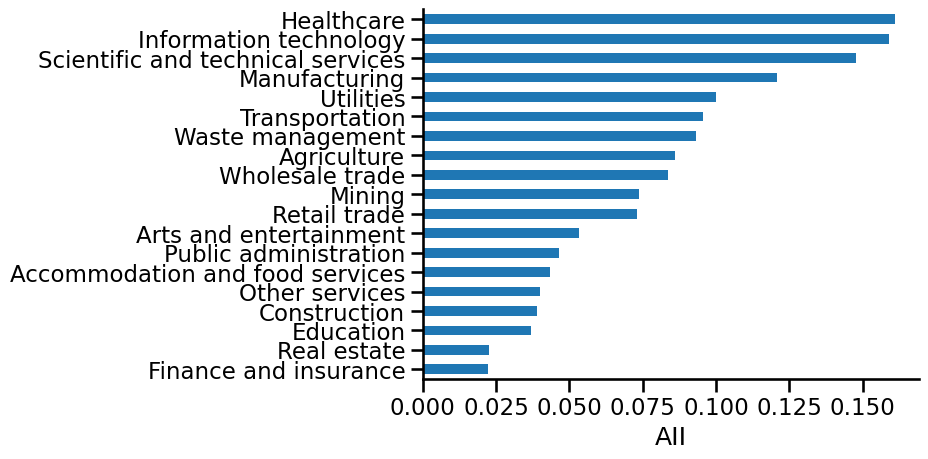

In [99]:
industry_scores = compute_industry_scores(occupations, jobs_aii)
industry_scores.set_index('Response').rename(sector_name).aii.sort_values().plot.barh()
plt.xlabel('AII')
plt.ylabel('')
sns.despine()
plt.savefig('figures/sectors.pdf', bbox_inches='tight')

In [100]:
occ_agg = (
    occupations
    .filter(pl.col('Item') == 'NAICS Sector')
    .filter(pl.col('Percent') != 'n/a')
    # .filter(pl.col('Percent') != "0.0")
    .filter(pl.col('Percent').cast(float) > 50)
    .join(pl.from_dataframe(jobs_aii), on='O*NET-SOC Code')
    .join(pl.from_dataframe(tasks), on='O*NET-SOC Code')
    .to_pandas()
    .groupby('Response')
    .agg({
        'Task ID': pd.Series.nunique,
        'SOC Code': pd.Series.nunique
    })
    .reset_index()
)

In [101]:
patents[patents['year'].ge(2015) & patents['year'].le(2020)].shape[0] / patents[patents['year'].le(2020)].shape[0]

0.9611370197646014

In [102]:
patent_map = patents[patents['year'].ge(2015) & patents['year'].le(2020)].title.reset_index(drop=True).to_dict()
top_tasks = (
    occupations
    .filter(pl.col('Item') == 'NAICS Sector')
    .filter(pl.col('Percent') != 'n/a')
    # .filter(pl.col('Percent') != "0.0")
    .filter(pl.col('Percent').cast(float) > 50)
    .join(pl.from_dataframe(jobs_aii), on='O*NET-SOC Code')
    .join(pl.from_dataframe(tasks), on='O*NET-SOC Code')
    .sort(pl.col('similarity')).group_by('Response').tail(1)
    .select(
        pl.col('Response').alias('sector'),
        pl.col('Title'),
        pl.col('Task'),
        pl.col('patent_index'),
        pl.col('similarity')
    )
    .to_pandas()
)

top_tasks['patent'] = top_tasks['patent_index'].map(patent_map)

selected_occupations = (
    occupations
    .filter(pl.col('Item') == 'NAICS Sector')
    .filter(pl.col('Percent') != 'n/a')
    .filter(pl.col('Percent').cast(float) > 50)
    .select('O*NET-SOC Code')
    .to_numpy()
    .flatten()
    .tolist()
)

top_patents = (
    pl.from_dataframe(tasks)
    .filter(pl.col('patent_index').is_in(top_tasks['patent_index'].tolist()))
    .filter(pl.col('O*NET-SOC Code').is_in(selected_occupations))
    .group_by('patent_index')
    .agg(
        pl.col('Task ID').n_unique().alias('nb_tasks'),
        pl.col('SOC Code').n_unique().alias('nb_jobs'),
    )
    .to_pandas()
)

top_tasks = top_tasks.merge(
    top_patents,
    how='left',
    on='patent_index',
)

sector_summary = (
    occupations
    .filter(pl.col('Item') == 'NAICS Sector')
    .filter(pl.col('Percent') != 'n/a')
    .filter(pl.col('Percent').cast(float) > 50)
    .join(pl.from_dataframe(jobs_aii), on='O*NET-SOC Code')
    .join(pl.from_dataframe(tasks), on='O*NET-SOC Code')
    .group_by('Response')
    .agg(
        pl.col('Task ID').n_unique().alias('total_tasks'),
        pl.col('SOC Code').n_unique().alias('total_jobs'),
    )
    .select(
        pl.col('Response').alias('sector'),
        'total_tasks',
        'total_jobs',
    )
    .to_pandas()
)

In [103]:
print(
    pl.from_dataframe(top_tasks)
    .join(pl.from_dataframe(sector_summary), on='sector')
    .join(pl.from_dataframe(industry_scores), left_on='sector', right_on='Response')
    .sort('aii', descending=True)
    .select(
        pl.col('sector').alias('Sector'),
        pl.col('Task'),
        pl.col('patent').alias('Patent'),
        (pl.col('nb_tasks').cast(str) + pl.lit(" (") + pl.col('total_tasks').cast(str) + pl.lit(")")).alias('# Tasks Impacted by Patent'),
        (pl.col('nb_jobs').cast(str) + pl.lit(" (") + pl.col('total_jobs').cast(str) + pl.lit(")")).alias('# Occupations Impacted by Patent'),
    )
    .to_pandas()
    .style.to_latex()
)

\begin{tabular}{llllll}
 & Sector & Task & Patent & # Tasks Impacted by Patent & # Occupations Impacted by Patent \\
0 & Health care and social assistance & Interpret images using computer-aided detection or diagnosis systems. & Methods and systems for automatically analyzing clinical images using rules and image analytics & 1 (1459) & 1 (70) \\
1 & Information & Test circuits and components of malfunctioning telecommunications equipment to isolate sources of malfunctions, using test meters, circuit diagrams, polarity probes, and other hand tools. & Telecommunications network troubleshooting systems & 16 (314) & 13 (13) \\
2 & Professional, Scientific and Technical Services & Analyze aerial photographs to detect and interpret significant military, industrial, resource, or topographical data. & Determining stockpile volume based on digital aerial images and three-dimensional representations of a site & 1 (329) & 1 (15) \\
3 & Manufacturing & Examine chemical or biological samples to ide

In [105]:
df_sectors = pd.DataFrame()
for year, group in df_aii.groupby('year'):
    df_sectors = pd.concat([
        df_sectors,
        compute_industry_scores(occupations, group, year)
    ], ignore_index=True)
df_sectors = df_sectors.rename({'Response': 'sector'}, axis=1)

In [107]:
sector_trends = []
for sector, group in df_sectors.groupby('sector'):
    reg = LinearRegression()
    support = np.arange(len(group)).reshape(-1, 1)
    y = group['aii']
    reg.fit(support, y)
    y_pred = reg.predict(support)
    r2 = r2_score(y, y_pred)
    sector_trends.append({
        'sector': sector,
        'slope': reg.coef_[0],
        'difference': group['aii'].max() - group['aii'].min(),
        'aii': group['aii'].max(),
        'r2': r2,
    })
sector_trends = pd.DataFrame(sector_trends)

In [108]:
sector_trends['group'] = pd.qcut(sector_trends['difference'], 3).cat.codes

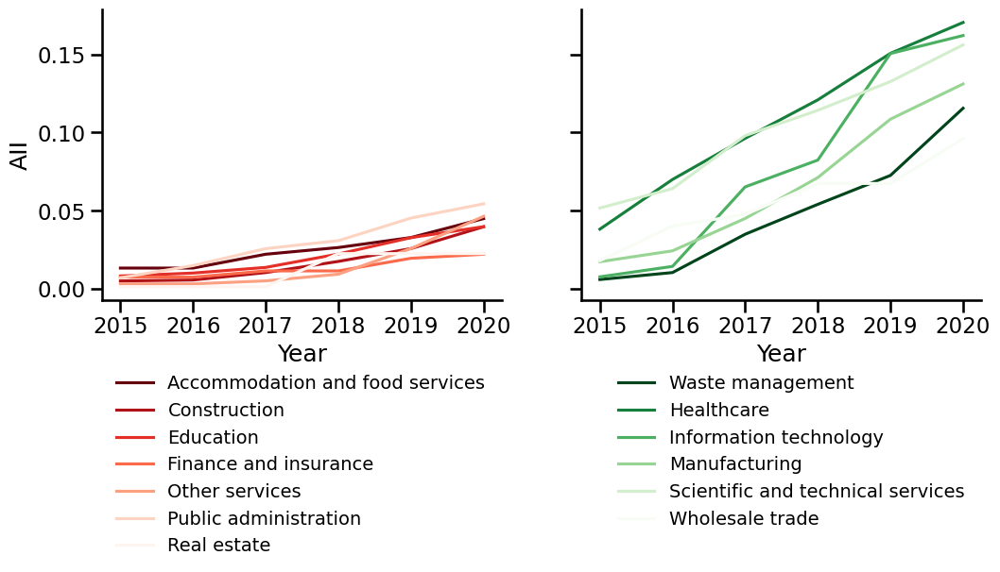

In [109]:
fig, axes = plt.subplots(ncols=2, figsize=(12, 4), sharey=True)
for ax, (g, group), c in zip(axes, sector_trends.query('group in [0, 2]').groupby('group'), ['Reds_r', 'Greens_r']):
    df_sectors.query('sector in @group.sector').pivot_table(
        index='year',
        columns='sector',
        values='aii'
    ).rename(sector_name, axis=1).plot.line(cmap=c, ax=ax)
    # ax.set_ylim(0.35, 0.65)
    ax.set_xticks(np.arange(2015, 2021))
    ax.set_xlabel('Year')
    ax.set_ylabel('AII')
    ax.legend(bbox_to_anchor=(1, -0.2), frameon=False, fontsize=14)
    # plt.tight_layout()
    sns.despine()
plt.savefig('figures/trends-sectors.pdf', bbox_inches='tight')

In [110]:
sector_job = (
    occupations
    .filter(pl.col('Item') == 'NAICS Sector')
    .filter(pl.col('Percent') != 'n/a')
    .join(pl.from_dataframe(jobs_aii), on='O*NET-SOC Code')
    # .sort(pl.col('Percent').cast(float)).group_by('Response').tail(68) # Only taking top 10%
    .filter(pl.col('Percent').cast(float) > 50)
    .with_columns(
        (pl.col('Percent').cast(float) * pl.col('aii')).alias('score')
    )
    .select(
        pl.col('Response').alias('sector'),
        'SOC Code',
        'Title',
        'Description'
    )
)

In [111]:
for i, rate in enumerate(['low', 'mid', 'high']):
    (
        pl.from_dataframe(sector_trends)
        .filter(pl.col('group').eq(i))
        .join(sector_job, how='left', on='sector')
        .select('sector', 'SOC Code', 'Title', 'Description')
        .join(pl.from_dataframe(tasks), how='left', on='SOC Code')
        .select('sector', 'SOC Code', 'Title', 'Description', 'Task', 'similarity_t', 'patent_index')
        .with_columns(pl.col('patent_index').map_dict(patent_map).alias('patent'))
        .to_pandas()
        .to_csv(f'datasets/trend_{rate}.csv', index=False)
    )

In [112]:
missing_jobs = set(data['SOC Code']) - set(
    occupations
    .filter(pl.col('Item') == 'NAICS Sector')
    .filter(pl.col('Percent') != 'n/a')
    .join(pl.from_dataframe(jobs_aii), on='O*NET-SOC Code')
    .filter(pl.col('Percent').cast(float) > 50)
    .select(pl.col('SOC Code').unique())
    .to_pandas()['SOC Code']
    .tolist()
)

In [113]:
pd.merge(
    data.query('`SOC Code` in @missing_jobs').nsmallest(10, 'aii'),
    jobs,
    how='left',
    on='SOC Code'
).merge(
    tasks[['SOC Code', 'Task']],
    how='left',
    on='SOC Code'
).to_csv('datasets/table_managers.csv', index=False)

# States

In [146]:
df_county = pd.read_csv('datasets/AIOE/Input/county_naics_2019.csv', dtype={'industry_code': str, 'area_fips': str})
df_county['sector_code'] = df_county['industry_code'].str[:2]
df_county['fips'] = df_county['area_fips'].str[:2]
df_county.head()

,area_fips,own_code,industry_code,agglvl_code,size_code,year,qtr,disclosure_code,annual_avg_estabs,annual_avg_emplvl,...,oty_taxable_annual_wages_pct_chg,oty_annual_contributions_chg,oty_annual_contributions_pct_chg,oty_annual_avg_wkly_wage_chg,oty_annual_avg_wkly_wage_pct_chg,oty_avg_annual_pay_chg,oty_avg_annual_pay_pct_chg,naics_length,sector_code,fips
0,01000,1,1021,53,0,2019,A,NaN,615,11119,...,0.0,0,0.0,-25,-1.9,-1302,-1.9,4,10,01
1,01000,1,1022,53,0,2019,A,NaN,2,11,...,0.0,0,0.0,25,4.9,1317,5.0,4,10,01
2,01000,1,1023,53,0,2019,A,NaN,18,139,...,0.0,0,0.0,-23,-1.4,-1222,-1.4,4,10,01
3,01000,1,1024,53,0,2019,A,NaN,44,1913,...,0.0,0,0.0,67,3.9,3500,4.0,4,10,01
4,01000,1,1025,53,0,2019,A,NaN,38,6926,...,0.0,0,0.0,27,2.0,1373,1.9,4,10,01


In [147]:
import requests

geojson = requests.get('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json').json()

In [148]:
naics_mapping = {
    11: 'Agriculture, forestry, fishing and hunting',
    21: 'Mining',
    22: 'Utilities',
    23: 'Construction',
    31: 'Manufacturing',
    32: 'Manufacturing',
    33: 'Manufacturing',
    42: 'Wholesale trade',
    44: 'Retail trade',
    45: 'Retail trade',
    48: 'Transportation and warehousing',
    49: 'Transporation and warehousing',
    51: 'Information',
    52: 'Finance and insurance',
    53: 'Real estate and rental and leasing',
    54: 'Professional, Scientific, and Technical Services',
    55: 'Management of Companies and Enterprises',
    56: 'Administrative and support and waste management and remediation services',
    61: 'Education services',
    62: 'Health care and social assistance',
    71: 'Arts, entertainment, and recreation',
    72: 'Accommodation and food services',
    81: 'Other services, except public administration',
    92: 'Public administration',
}

In [149]:
county_data = df_county[~df_county['fips'].isin(['72', '78', 'C1', 'C2', 'C3', 'C4', 'US'])].copy()

In [150]:
county_data['sector'] = county_data['sector_code'].astype('int').map(naics_mapping)

In [151]:
state_data = (
    pl.from_dataframe(county_data)
    .filter(pl.col('area_fips').str.ends_with('000'))
    .to_pandas()
)
state_agg = state_data.groupby(['fips', 'sector']).annual_avg_emplvl.sum().reset_index()

county_agg = (
    pl.from_dataframe(county_data)
    .filter(~pl.col('area_fips').str.ends_with('000'))
    .select('area_fips', 'fips', 'sector', 'annual_avg_emplvl')
    .drop_nulls()
    .group_by(['area_fips', 'fips', 'sector'])
    .agg(pl.col('annual_avg_emplvl').sum())
    .to_pandas()
)
# county_agg = state_data[['area_fips', 'fips', 'sector', 'annual_avg_emplvl']].dropna().groupby(['area_fips', 'fips', 'sector']).sum().reset_index()

In [152]:
state_fips = pd.read_csv('https://raw.githubusercontent.com/kjhealy/fips-codes/master/state_fips_master.csv')
state_fips['fips'] = state_fips['fips'].apply(lambda x: '{:02d}'.format(x))

In [153]:
from sklearn.preprocessing import StandardScaler

def compute_state_scores(county_agg, state_fips, sector_trends, grouping='area_fips'):
    aige = pd.merge(
        county_agg,
        sector_trends,
        how='left',
        on='sector'
    ).dropna()

    aige_map = (
        pl.from_dataframe(aige)
        .with_columns(
            pl.col('annual_avg_emplvl').truediv(pl.col('annual_avg_emplvl').sum().over(grouping)).alias('weight')
        )
        .with_columns(
            pl.col('aii').mul(pl.col('weight')).alias('aii_normalized')
        )
        .group_by(grouping)
        .agg(pl.col('aii_normalized').sum())
        .to_pandas()
    )

    aige_map['aii_scaled'] = StandardScaler().fit_transform(aige_map[['aii_normalized']])

    if grouping == 'area_fips':
        return aige_map
    else:
        aigi = pd.merge(
            aige_map,
            state_fips,
            how='left',
            on='fips'
        )

        return aigi

In [154]:
area_titles = pd.read_csv('datasets/area-titles.tsv', sep='\t', names=['area_fips', 'title'])

In [155]:
aigi = compute_state_scores(
    county_agg,
    # state_agg,
    state_fips,
    sector_trends
)
aigi = pd.merge(aigi, area_titles, how='left', on='area_fips')

In [157]:
compute_state_scores(
    county_agg,
    state_fips,
    sector_trends,
    grouping='fips'
).sort_values('aii_scaled')

,fips,aii_normalized,aii_scaled,state_name,state_abbr,long_name,sumlev,region,division,state,region_name,division_name
2,56,0.073793,-2.493891,Wyoming,WY,Wyoming WY,40.0,4.0,8.0,56.0,West,Mountain
5,11,0.074318,-2.377631,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
40,46,0.076008,-2.002814,South Dakota,SD,South Dakota SD,40.0,2.0,4.0,46.0,Midwest,West North Central
20,30,0.077122,-1.755643,Montana,MT,Montana MT,40.0,4.0,8.0,30.0,West,Mountain
36,32,0.077721,-1.622947,Nevada,NV,Nevada NV,40.0,4.0,8.0,32.0,West,Mountain
18,38,0.078422,-1.467351,North Dakota,ND,North Dakota ND,40.0,2.0,4.0,38.0,Midwest,West North Central
32,15,0.078631,-1.421009,Hawaii,HI,Hawaii HI,40.0,4.0,9.0,15.0,West,Pacific
3,50,0.080606,-0.983011,Vermont,VT,Vermont VT,40.0,1.0,1.0,50.0,Northeast,New England
44,19,0.080673,-0.968308,Iowa,IA,Iowa IA,40.0,2.0,4.0,19.0,Midwest,West North Central
28,10,0.081800,-0.718205,Delaware,DE,Delaware DE,40.0,3.0,5.0,10.0,South,South Atlantic


In [158]:
us = pd.read_csv('datasets/us_states_geo.csv')
mega = pd.read_csv('datasets/US_State_Control_Data_Master.csv')
ise = pd.read_csv('datasets/ISE_states.csv')

/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


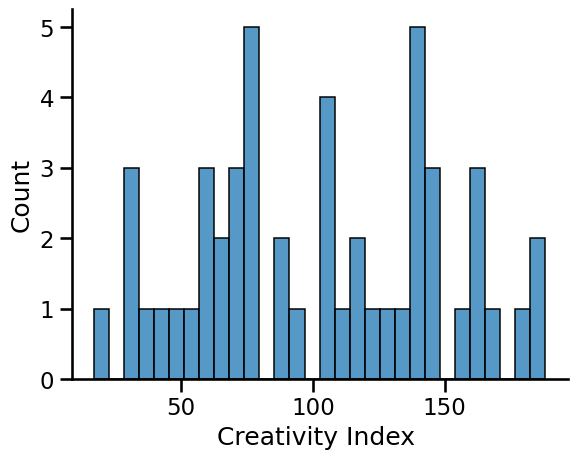

In [159]:
sns.histplot(x=ise['Creativity Index '], bins=30)
sns.despine()

In [160]:
state_joined = compute_state_scores(
    county_agg,
    state_fips,
    sector_trends,
    grouping='fips'
).merge(
    us[['state_code', 'gdp per capita (2017)', 'gini-coefficient']],
    how='left',
    left_on='state_abbr',
    right_on='state_code'
).merge(
    # mega[['State Abbreviation', 'E_1a_occupationArtistic']].rename({'State Abbreviation': 'state_abbr'}, axis=1),
    ise[['State Abbreviation', 'Creativity Index ']].rename({'State Abbreviation': 'state_abbr', 'Creativity Index ': 'creativity'}, axis=1),
    how='left',
    on='state_abbr'
)

In [161]:
state_joined[['aii_scaled', 'gdp per capita (2017)']].corr()

,aii_scaled,gdp per capita (2017)
aii_scaled,1.00000,-0.05213
gdp per capita (2017),-0.05213,1.00000


In [162]:
state_joined[['aii_scaled', 'gini-coefficient']].corr()

,aii_scaled,gini-coefficient
aii_scaled,1.000000,0.301154
gini-coefficient,0.301154,1.000000


In [163]:
state_joined.sort_values([
    'gini-coefficient',
    'aii_scaled',
]).tail(10)

,fips,aii_normalized,aii_scaled,state_name,state_abbr,long_name,sumlev,region,division,state,region_name,division_name,state_code,gdp per capita (2017),gini-coefficient,creativity
32,34,0.086825,0.396055,New Jersey,NJ,New Jersey NJ,40.0,1.0,2.0,34.0,Northeast,Middle Atlantic,NJ,56472.0,0.4813,158.0
44,21,0.087999,0.656364,Kentucky,KY,Kentucky KY,40.0,3.0,6.0,21.0,South,East South Central,KY,38603.0,0.4813,40.0
1,28,0.084248,-0.175341,Mississippi,MS,Mississippi MS,40.0,3.0,6.0,28.0,South,East South Central,MS,31633.0,0.4828,30.0
50,01,0.085251,0.046952,Alabama,AL,Alabama AL,40.0,3.0,6.0,1.0,South,East South Central,AL,36856.0,0.4847,75.0
20,12,0.085098,0.013050,Florida,FL,Florida FL,40.0,3.0,5.0,12.0,South,South Atlantic,FL,39093.0,0.4852,131.0
9,06,0.089254,0.934861,California,CA,California CA,40.0,4.0,9.0,6.0,West,Pacific,CA,57328.0,0.4899,184.0
14,09,0.088979,0.873879,Connecticut,CT,Connecticut CT,40.0,1.0,1.0,9.0,Northeast,New England,CT,63747.0,0.4945,167.0
38,22,0.086446,0.311942,Louisiana,LA,Louisiana LA,40.0,3.0,7.0,22.0,South,West South Central,LA,44293.0,0.4990,67.0
4,36,0.086823,0.395581,New York,NY,New York NY,40.0,1.0,2.0,36.0,Northeast,Middle Atlantic,NY,64093.0,0.5229,178.0
8,11,0.074318,-2.377631,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [164]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

temp = state_joined[['state_name', 'aii_scaled', 'gdp per capita (2017)', 'gini-coefficient', 'creativity']].dropna()
mdl = LinearRegression()
mdl.fit(temp[['aii_scaled']], temp['gdp per capita (2017)'])
r2_score(temp['gdp per capita (2017)'], mdl.predict(temp[['aii_scaled']]))

0.002717514912375263

In [165]:
temp[np.abs((temp['gini-coefficient'] - temp['gini-coefficient'].mean()) / temp['gini-coefficient'].std()).ge(2)]

,state_name,aii_scaled,gdp per capita (2017),gini-coefficient,creativity
4,New York,0.395581,64093.0,0.5229,178.0
21,Utah,-0.163766,44204.0,0.4063,104.0
42,Alaska,-0.298877,67705.0,0.4081,72.0


In [166]:
mdl = LinearRegression()
mdl.fit(temp[['aii_scaled']], temp['gini-coefficient'])
y_true = temp['gini-coefficient'].values
y_pred = mdl.predict(temp[['aii_scaled']])

residuals = y_true - y_pred
z_residuals = (residuals - residuals.mean()) / residuals.std()
temp[np.abs(z_residuals) > 2]
# r2_score(temp['gini-coefficient'], mdl.predict(temp[['aii_scaled']]))


,state_name,aii_scaled,gdp per capita (2017),gini-coefficient,creativity
4,New York,0.395581,64093.0,0.5229,178.0
21,Utah,-0.163766,44204.0,0.4063,104.0
41,New Hampshire,0.937902,50456.0,0.4304,137.0
42,Alaska,-0.298877,67705.0,0.4081,72.0


/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


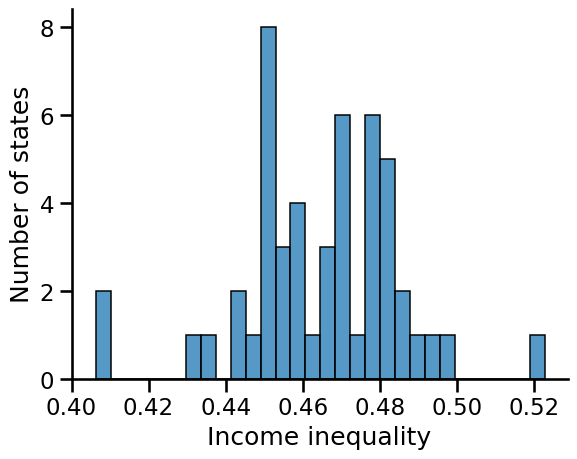

In [167]:
sns.histplot(x=state_joined['gini-coefficient'], bins=30)
plt.xlim(0.4)
plt.xlabel('Income inequality')
plt.ylabel('Number of states')
sns.despine()
plt.savefig('figures/hist-inequality.pdf', bbox_inches='tight')

/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


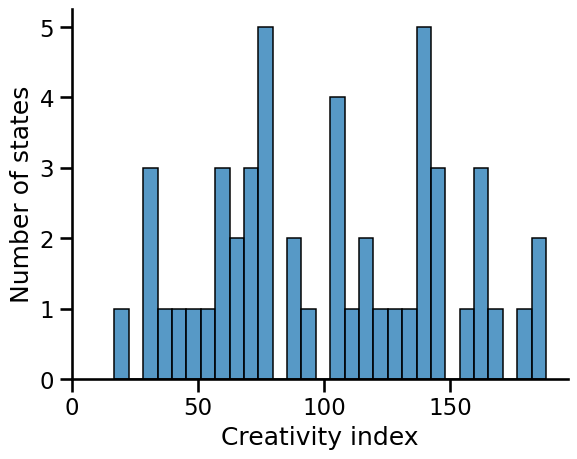

In [168]:
sns.histplot(x=state_joined['creativity'], bins=30)
plt.xlim(0)
plt.xlabel('Creativity index')
plt.ylabel('Number of states')
sns.despine()
plt.savefig('figures/hist-creativity.pdf', bbox_inches='tight')

/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


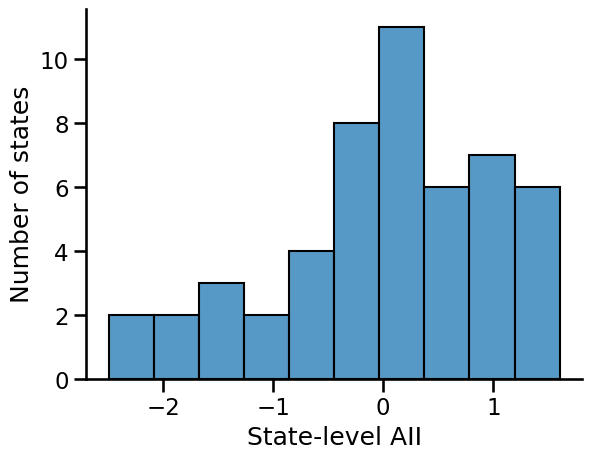

In [169]:
sns.histplot(x=state_joined['aii_scaled'], bins=10)
plt.xlabel('State-level AII')
plt.ylabel('Number of states')
sns.despine()
plt.savefig('figures/hist-aii.pdf', bbox_inches='tight')

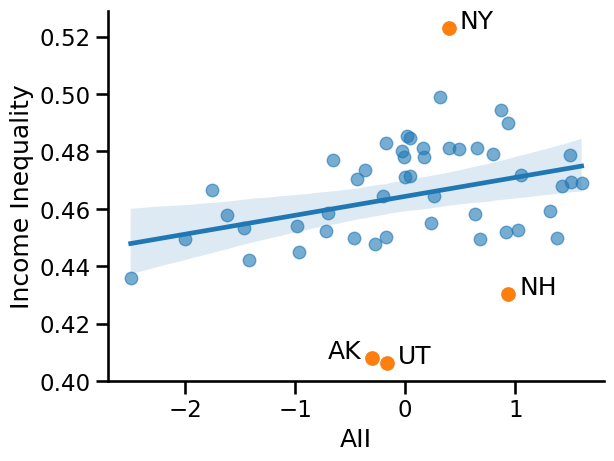

In [170]:
sns.regplot(
    state_joined,
    x='aii_scaled',
    y='gini-coefficient',
    scatter_kws=dict(
        alpha=.6,
    ),
)
outliers = state_joined[state_joined['state_abbr'].isin(['AK', 'UT', 'NH', 'NY'])]
plt.scatter(outliers['aii_scaled'], outliers['gini-coefficient'], c='C1')
for idx, row in outliers.iterrows():
    if row['state_abbr'] == 'AK':
        xy = (row['aii_scaled'] - .4, row['gini-coefficient'])
    else:
        xy = (row['aii_scaled'] + .1, row['gini-coefficient'])
    plt.annotate(row['state_abbr'], xy)
plt.ylim(0.4)
plt.xlabel('AII')
plt.ylabel('Income Inequality')
sns.despine()
# plt.savefig('figures/aigi-gini.pdf', bbox_inches='tight')

In [171]:
state_joined[['aii_scaled', 'creativity']].corr()

,aii_scaled,creativity
aii_scaled,1.000000,0.396592
creativity,0.396592,1.000000


In [172]:
data['aioe'].mean()

-6.84754518031752e-09

In [173]:
(
    pl.from_dataframe(tasks.merge(
        data,
        how='left',
        on='SOC Code'
    ))
    .filter(pl.col('Occupation Title').str.contains('Concierge'))
    .select('SOC Code', 'Task')
    .to_pandas()
)

,SOC Code,Task
0,39-6012,"Make reservations for patrons, such as for dinner, spa treatments, or golf tee times, and obtain..."
1,39-6012,"Provide information about local features, such as shopping, dining, nightlife, or recreational d..."
2,39-6012,Make travel arrangements for sightseeing or other tours.
3,39-6012,"Receive, store, or deliver luggage or mail."
4,39-6012,"Carry out unusual requests, such as searching for hard-to-find items or arranging for exotic ser..."
5,39-6012,Pick up and deliver items or run errands for guests.
6,39-6012,Provide directions to guests.
7,39-6012,Arrange for interpreters or translators when patrons require such services.
8,39-6012,"Provide business services for guests, such as sending or receiving faxes or shipping packages."
9,39-6012,"Plan special events, parties, or meetings, which may include booking musicians or celebrities."


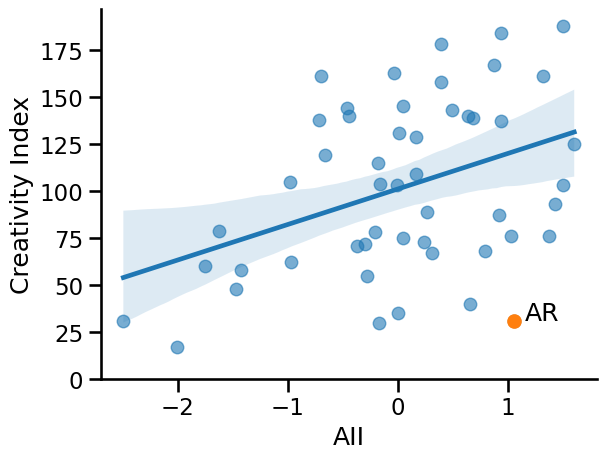

In [174]:
sns.regplot(
    state_joined,
    x='aii_scaled',
    y='creativity',
    scatter_kws=dict(
        alpha=.6,
    ),
)
outliers = state_joined[state_joined['state_abbr'].isin(['AR'])]
plt.scatter(outliers['aii_scaled'], outliers['creativity'], c='C1')
for idx, row in outliers.iterrows():
    xy = (row['aii_scaled'] + .1, row['creativity'])
    plt.annotate(row['state_abbr'], xy)
plt.ylim(0)
plt.xlabel('AII')
plt.ylabel('Creativity Index')
sns.despine()
# plt.savefig('figures/aigi-creative.pdf', bbox_inches='tight')

In [175]:
aigi['fips'] = aigi['area_fips'].str[:2]

In [176]:
pd.merge(
    aigi.groupby('fips').agg({'aii_normalized': 'mean'}).reset_index(),
    state_fips,
    how='left',
    on='fips',
).nlargest(3, 'aii_normalized')

,fips,aii_normalized,state_name,state_abbr,long_name,sumlev,region,division,state,region_name,division_name
38,42,0.089518,Pennsylvania,PA,Pennsylvania PA,40.0,1.0,2.0,42.0,Northeast,Middle Atlantic
6,09,0.086941,Connecticut,CT,Connecticut CT,40.0,1.0,1.0,9.0,Northeast,New England
21,25,0.086519,Massachusetts,MA,Massachusetts MA,40.0,1.0,1.0,25.0,Northeast,New England


In [177]:
pd.merge(
    aigi.groupby('fips').agg({'aii_normalized': 'mean'}).reset_index(),
    state_fips,
    how='left',
    on='fips',
).nsmallest(3, 'aii_normalized')

,fips,aii_normalized,state_name,state_abbr,long_name,sumlev,region,division,state,region_name,division_name
26,30,0.067852,Montana,MT,Montana MT,40.0,4.0,8.0,30.0,West,Mountain
44,49,0.069381,Utah,UT,Utah UT,40.0,4.0,8.0,49.0,West,Mountain
5,08,0.069626,Colorado,CO,Colorado CO,40.0,4.0,8.0,8.0,West,Mountain


In [178]:
print(
    pd.DataFrame({
        'Highest scoring': aigi.nlargest(20, 'aii_scaled').title.values,
        'Lowest scoring': aigi.nsmallest(20, 'aii_scaled').title.values,
    })
    .style.to_latex()
)

\begin{tabular}{lll}
 & Highest scoring & Lowest scoring \\
0 & Issaquena County, Mississippi & Wallace County, Kansas \\
1 & Petroleum County, Montana & Hinsdale County, Colorado \\
2 & Buffalo County, South Dakota & Twiggs County, Georgia \\
3 & Macon County, Alabama & Heard County, Georgia \\
4 & Jefferson County, Mississippi & Graham County, North Carolina \\
5 & Starr County, Texas & Garfield County, Montana \\
6 & Iron County, Missouri & Storey County, Nevada \\
7 & Metcalfe County, Kentucky & Phillips County, Montana \\
8 & Calhoun County, Arkansas & Clark County, Idaho \\
9 & Ripley County, Missouri & Ottawa County, Kansas \\
10 & Galax City, Virginia & Zavala County, Texas \\
11 & Dillingham Census Area, Alaska & McPherson County, South Dakota \\
12 & Evangeline Parish, Louisiana & Red Lake County, Minnesota \\
13 & Aleutians East Borough, Alaska & Judith Basin County, Montana \\
14 & Franklin City, Virginia & Gates County, North Carolina \\
15 & Sherman County, Nebraska & Cal

In [179]:
aigi['is_positive'] = aigi['aii_scaled'].ge(0)

In [180]:
import plotly.express as px

fig = px.choropleth(
    aigi,
    geojson=geojson, locations='area_fips', color='aii_scaled', scope='usa',
    # color_continuous_scale='PuOr_r',
    color_continuous_scale=['#5e3c99', '#b2abd2', '#ffffff', '#fdb863', '#e66101'],
    range_color=(-2.5, 2.5),
    width=800
)

fig.update_layout(
    coloraxis_colorbar_x=0.95,
    coloraxis_colorbar=dict(
        title="AII",
    ),
    margin=dict(
        l=0, r=0, t=0, b=0
    ),
)
fig.update_traces(marker_line_width=0.3)
fig.show()
fig.write_image('figures/aigi-counties.pdf')

In [181]:
selected_regions = [
    '53033', # Seattle
    '06085', # Silicon Valley
    '36061', # Manhattan, New York
    '02185', # Alaska
]

In [182]:
(
    pl.from_dataframe(county_agg)
    .filter(pl.col('area_fips').is_in(selected_regions))
    .with_columns(
        pl.col('annual_avg_emplvl').sum().over('area_fips').alias('total_emp')
    )
    .with_columns(
        pl.col('annual_avg_emplvl').truediv(pl.col('total_emp')).alias('impacted_workforce')
    )
    .sort('annual_avg_emplvl')
    # .group_by('area_fips').tail(1)
    .join(pl.from_dataframe(aigi), on='area_fips')
    .pivot(
        index='sector',
        columns='title',
        values='impacted_workforce'
    )
    .to_pandas()
    .set_index('sector')
    .fillna(0)
    .style.format('{:.0%}')
)

,"Santa Clara County, California","North Slope Borough, Alaska","King County, Washington","New York County, New York"
sector,,,,
Mining,0%,60%,0%,0%
Utilities,0%,0%,0%,0%
"Agriculture, forestry, fishing and hunting",0%,0%,0%,0%
Transporation and warehousing,1%,0%,1%,1%
Transportation and warehousing,1%,0%,3%,0%
Management of Companies and Enterprises,1%,3%,2%,3%
Real estate and rental and leasing,1%,0%,2%,4%
"Arts, entertainment, and recreation",1%,0%,2%,3%
Finance and insurance,2%,0%,3%,12%


In [183]:
df_states = pd.DataFrame()
for year in range(2015, 2021):
    df_states = pd.concat([
        df_states,
        compute_state_scores(
            county_agg, state_fips, df_sectors[df_sectors['year'].le(year)]
        ).assign(year=year)
    ], ignore_index=True)
df_states = pd.merge(df_states, area_titles, how='left', on='area_fips')

In [184]:
state_entropy = (
    pl.from_dataframe(state_agg)
    .with_columns(
        pl.col('annual_avg_emplvl').sum().over('fips').alias('total_emplvl')
    )
    .with_columns(
        pl.col('annual_avg_emplvl').truediv(pl.col('total_emplvl')).alias('pk')
    )
    .with_columns(
        pl.col('pk').mul(pl.col('pk').map_elements(np.log2)).fill_nan(0)
    )
    .group_by('fips')
    .agg(-pl.col('pk').sum())
    .to_pandas()
)

/Users/aliakbars/miniforge3/lib/python3.10/site-packages/polars/series/series.py:5028: RuntimeWarning:

divide by zero encountered in log2

/Users/aliakbars/miniforge3/lib/python3.10/site-packages/polars/series/series.py:5028: RuntimeWarning:

divide by zero encountered in log2



In [185]:
county_entropy = (
    pl.from_dataframe(county_agg)
    .with_columns(
        pl.col('annual_avg_emplvl').sum().over('area_fips').alias('total_emplvl')
    )
    .with_columns(
        pl.col('annual_avg_emplvl').truediv(pl.col('total_emplvl')).alias('pk')
    )
    .with_columns(
        pl.col('pk').mul(pl.col('pk').map_elements(np.log2)).fill_nan(0)
    )
    .group_by('area_fips')
    .agg(-pl.col('pk').sum())
    .to_pandas()
)

/Users/aliakbars/miniforge3/lib/python3.10/site-packages/polars/series/series.py:5028: RuntimeWarning:

divide by zero encountered in log2

/Users/aliakbars/miniforge3/lib/python3.10/site-packages/polars/series/series.py:5028: RuntimeWarning:

divide by zero encountered in log2



/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



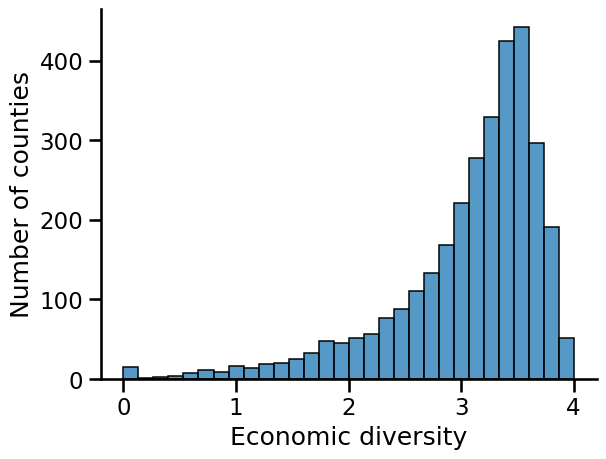

In [186]:
sns.histplot(county_entropy['pk'], bins=30)
plt.xlabel('Economic diversity')
plt.ylabel('Number of counties')
sns.despine()
plt.savefig('figures/hist-entropy.pdf', bbox_inches='tight')

In [187]:
county_entropy['pk'].describe()

count    3191.000000
mean        3.065215
std         0.678536
min         0.000000
25%         2.808321
50%         3.264609
75%         3.524680
max         4.004835
Name: pk, dtype: float64

In [188]:
top_regions = aigi.nlargest(20, 'aii_scaled').area_fips.tolist()
bottom_regions = aigi.nsmallest(20, 'aii_scaled').area_fips.tolist()

In [189]:
county_agg.query('area_fips == "48201"')

,area_fips,fips,sector,annual_avg_emplvl
14765,48201,48,Real estate and rental and leasing,52812
14766,48201,48,"Agriculture, forestry, fishing and hunting",1509
14767,48201,48,Mining,64996
22682,48201,48,Retail trade,209565
30945,48201,48,Transportation and warehousing,92962
30946,48201,48,Information,27364
30947,48201,48,Finance and insurance,69896
30948,48201,48,Health care and social assistance,264190
30949,48201,48,"Other services, except public administration",69284
30950,48201,48,Public administration,54238


In [190]:
county_entropy['pk'].describe()

count    3191.000000
mean        3.065215
std         0.678536
min         0.000000
25%         2.808321
50%         3.264609
75%         3.524680
max         4.004835
Name: pk, dtype: float64

In [191]:
(
    pl.from_dataframe(county_agg)
    .with_columns(
        pl.col('annual_avg_emplvl').sum().over('area_fips').alias('total_emp')
    )
    .sort('annual_avg_emplvl')
    .group_by('area_fips').tail(1)
    .join(pl.from_dataframe(aigi), on='area_fips')
    .join(pl.from_dataframe(county_entropy), on='area_fips')
    .sort('pk', descending=True)
    .head(20)
    .select(
        pl.col('area_fips'),
        pl.col('title').alias('County'),
        # pl.col('annual_avg_emplvl').truediv(pl.col('total_emp')).alias('Impacted Workforce'),
        pl.col('pk').alias('Economic Diversity'),
        pl.col('sector').alias('Most Prevalent Sector'),
    )
    .to_pandas()
)

,area_fips,County,Economic Diversity,Most Prevalent Sector
0,08031,"Denver County, Colorado",4.004835,"Professional, Scientific, and Technical Services"
1,48113,"Dallas County, Texas",3.991043,Health care and social assistance
2,48201,"Harris County, Texas",3.989910,Health care and social assistance
3,41051,"Multnomah County, Oregon",3.979766,Health care and social assistance
4,49035,"Salt Lake County, Utah",3.975409,Retail trade
5,55025,"Dane County, Wisconsin",3.961787,Health care and social assistance
6,34013,"Essex County, New Jersey",3.937420,Health care and social assistance
7,19113,"Linn County, Iowa",3.937272,Retail trade
8,08001,"Adams County, Colorado",3.933889,Construction
9,13121,"Fulton County, Georgia",3.932661,"Professional, Scientific, and Technical Services"


In [192]:
print(
    pl.from_dataframe(county_agg)
    .filter(pl.col('area_fips').is_in(top_regions))
    .with_columns(
        pl.col('annual_avg_emplvl').sum().over('area_fips').alias('total_emp')
    )
    .sort('annual_avg_emplvl')
    .group_by('area_fips').tail(1)
    .join(pl.from_dataframe(aigi), on='area_fips')
    .join(pl.from_dataframe(county_entropy), on='area_fips')
    .sort('aii_scaled', descending=True)
    .select(
        pl.col('area_fips'),
        pl.col('title').alias('County'),
        # pl.col('annual_avg_emplvl').truediv(pl.col('total_emp')).alias('Impacted Workforce'),
        pl.col('pk').alias('Economic Diversity'),
        pl.col('sector').alias('Most Prevalent Sector'),
    )
    .to_pandas()
    .style.format({'Economic Diversity': '{:.2f}'})
    .to_latex()
)

\begin{tabular}{lllrl}
 & area_fips & County & Economic Diversity & Most Prevalent Sector \\
0 & 28055 & Issaquena County, Mississippi & 0.54 & Health care and social assistance \\
1 & 30069 & Petroleum County, Montana & 1.30 & Health care and social assistance \\
2 & 46017 & Buffalo County, South Dakota & 1.46 & Health care and social assistance \\
3 & 01087 & Macon County, Alabama & 1.67 & Health care and social assistance \\
4 & 28063 & Jefferson County, Mississippi & 1.79 & Health care and social assistance \\
5 & 48427 & Starr County, Texas & 1.74 & Health care and social assistance \\
6 & 29093 & Iron County, Missouri & 1.80 & Health care and social assistance \\
7 & 21169 & Metcalfe County, Kentucky & 1.99 & Health care and social assistance \\
8 & 05013 & Calhoun County, Arkansas & 0.55 & Manufacturing \\
9 & 29181 & Ripley County, Missouri & 2.27 & Health care and social assistance \\
10 & 51640 & Galax City, Virginia & 1.94 & Health care and social assistance \\
11 & 02070 & 

In [193]:
print(
    pl.from_dataframe(county_agg)
    .filter(pl.col('area_fips').is_in(bottom_regions))
    .with_columns(
        pl.col('annual_avg_emplvl').sum().over('area_fips').alias('total_emp')
    )
    .sort('annual_avg_emplvl')
    .group_by('area_fips').tail(1)
    .join(pl.from_dataframe(aigi), on='area_fips')
    .join(pl.from_dataframe(county_entropy), on='area_fips')
    .sort('aii_scaled', descending=False)
    .select(
        pl.col('title').alias('County'),
        # pl.col('annual_avg_emplvl').truediv(pl.col('total_emp')).alias('Impacted Workforce'),
        pl.col('pk').alias('Economic Diversity'),
        pl.col('sector').alias('Most Prevalent Sector'),
    )
    .to_pandas()
    .style.format({'Economic Diversity': '{:.2f}'})
    .to_latex()
)

\begin{tabular}{llrl}
 & County & Economic Diversity & Most Prevalent Sector \\
0 & Wallace County, Kansas & 1.55 & Finance and insurance \\
1 & Hinsdale County, Colorado & 1.55 & Construction \\
2 & Twiggs County, Georgia & 1.00 & Education services \\
3 & Heard County, Georgia & 1.18 & Education services \\
4 & Graham County, North Carolina & 2.39 & Education services \\
5 & Garfield County, Montana & 1.24 & Education services \\
6 & Storey County, Nevada & 1.00 & Transporation and warehousing \\
7 & Phillips County, Montana & 2.64 & Education services \\
8 & Clark County, Idaho & 1.07 & Education services \\
9 & Ottawa County, Kansas & 2.51 & Finance and insurance \\
10 & Zavala County, Texas & 1.39 & Education services \\
11 & McPherson County, South Dakota & 1.29 & Education services \\
12 & Red Lake County, Minnesota & 2.46 & Education services \\
13 & Judith Basin County, Montana & 1.99 & Education services \\
14 & Gates County, North Carolina & 1.99 & Education services \\
15 &

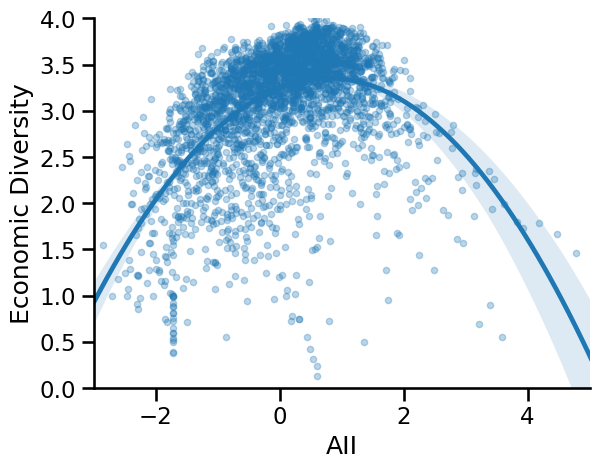

In [197]:
sns.regplot(
    x='aii_scaled',
    y='pk',
    data=pd.merge(
        aigi,
        county_entropy,
        how='left',
        on='area_fips'
    ),
    marker='.',
    scatter_kws=dict(
        alpha=.3
    ),
    order=2,
)
plt.xlim(-3, 5)
plt.ylim(0, 4)
plt.xlabel('AII')
plt.ylabel('Economic Diversity')
sns.despine()
plt.savefig('figures/aigi-entropy.pdf', bbox_inches='tight')

In [198]:
state_trends = []
for area_fips, group in df_states.groupby('area_fips'):
    if group['aii_normalized'].isna().all():
        continue
    reg = LinearRegression()
    support = np.arange(len(group)).reshape(-1, 1)
    y = group['aii_normalized']
    reg.fit(support, y)
    y_pred = reg.predict(support)
    r2 = r2_score(y, y_pred)
    state_trends.append({
        'area_fips': area_fips,
        'slope': reg.coef_[0],
        'difference': group['aii_normalized'].max() - group['aii_normalized'].min(),
        'aii': group['aii_normalized'].max(),
        'r2': r2,
    })
state_trends = pd.DataFrame(state_trends)

In [199]:
state_trends['group'] = pd.qcut(state_trends['difference'], 3).cat.codes

# Education

In [90]:
edu = pd.read_csv('datasets/db_24_3_text/Education, Training, and Experience.txt', sep='\t')
edu_categories = pd.read_csv('datasets/db_24_3_text/Education, Training, and Experience Categories.txt', sep='\t')

In [91]:
edu_rl = edu.query('`Scale ID` == "RL"').copy()

In [92]:
edu_rl['exp_edu'] = edu_rl['Category'] * edu_rl['Data Value'] / 100

In [93]:
# edu_level = edu_rl.groupby('Title').exp_edu.sum()
edu_level = edu_rl.sort_values(['O*NET-SOC Code', 'Data Value']).groupby('O*NET-SOC Code').tail(1).set_index('O*NET-SOC Code')[['Category']]
edu_level['exp_edu'] = edu_level['Category']
edu_level = edu_level.reset_index()
edu_level['SOC Code'] = edu_level['O*NET-SOC Code'].str[:7]
edu_level = edu_level.groupby(['SOC Code', 'Category']).agg({'exp_edu': 'mean'}).reset_index()

In [94]:
edu_rl['exp_edu'] = edu_rl['Category'] * edu_rl['Data Value']

In [95]:
edu_level = (
    pl.from_dataframe(edu_rl)
    .filter(pl.col('Data Value') == pl.col('Data Value').max().over('O*NET-SOC Code'))
    .select('O*NET-SOC Code', pl.col('Category').alias('exp_edu'))
    .to_pandas()
)
edu_level['SOC Code'] = edu_level['O*NET-SOC Code'].str[:7]
edu_level = edu_level.groupby('SOC Code').exp_edu.max().reset_index()

In [96]:
edu_level = (edu_rl.groupby('O*NET-SOC Code').agg({'exp_edu': 'sum'}) / 100).reset_index()
edu_level['SOC Code'] = edu_level['O*NET-SOC Code'].str[:7]
edu_level = edu_level.groupby('SOC Code').exp_edu.mean().reset_index()
edu_level['edu_group'] = pd.cut(edu_level['exp_edu'], [0, 1, 3, 5, 7, 13]).cat.codes

In [97]:
ai_edu = pd.merge(
    data,
    edu_level,
    how='left',
    on='SOC Code'
)

In [98]:
ai_edu['edu_group'].value_counts()

edu_group
1.0    315
2.0    182
3.0    153
4.0    123
Name: count, dtype: int64

In [101]:
sns.set_context('talk')

/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


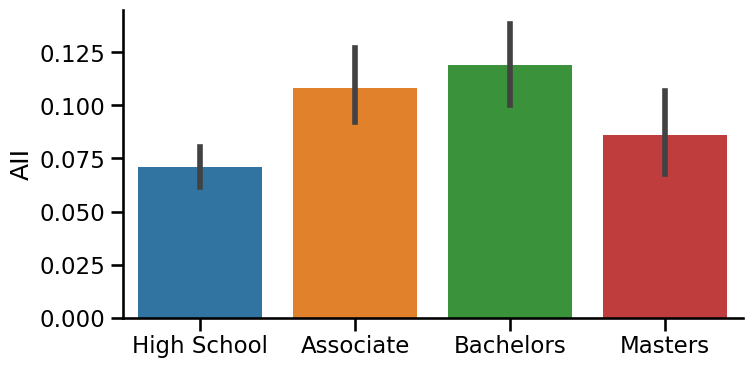

In [115]:
fig, ax = plt.subplots(figsize=(8, 4))
sns.barplot(
    x='edu_group',
    y='aii',
    data=ai_edu
)
plt.xticks(range(4), ['High School', 'Associate', 'Bachelors', 'Masters'])
plt.xlabel('')
plt.ylabel('AII')
sns.despine()
plt.savefig('figures/education.pdf', bbox_inches='tight')